# SWOT along-track SSH spectra in square boxes : sesonality of the signal


In [1]:
import glob
import os
import warnings
from collections import defaultdict
from pathlib import Path

import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.patheffects as pe

from swot_analysis import compute_pass_spectra
from swot_analysis import load_swot_l2_expert 

## 1. Configuration
Identical to GSER_SSH_spectra.ipynb — change only these values.

In [2]:
# ── Input files ───────────────────────────────────────────────────────────────
DATA_DIR    = '/Volumes/PortableSSD/'#'/Users/zoecas/Documents/data/'
#DATA_DIR    = '/Users/zoecas/Documents/data/'

DATA_SUBDIR = 'diags_2024/'

# ── Region of interest ────────────────────────────────────────────────────────
LAT_MIN, LAT_MAX = -60.0,60.0
LON_MIN, LON_MAX = 0.0,360.0

# ── Spectral parameters ───────────────────────────────────────────────────────
SEGMENT_LENGTH_KM = 250.0
BOX_DEG = 2.0
filename_pattern = f'{int(SEGMENT_LENGTH_KM)}km_demean_swh5.nc'

# ── Box size ──────────────────────────────────────────────────────────────────


# ── Expert-product variable names ─────────────────────────────────────────────
SSH_VAR = 'ssha_karin_2'
HRET    = False   # add internal tide correction (height_cor_xover + internal_tide_hret)

## 3. Defining functions
( `build_box_dataset`).

In [3]:
def build_box_dataset(ds_segments: xr.Dataset,
                      box_deg: float = 2.0,
                      min_sampling_fraction: float = 0.5) -> xr.Dataset:

    from collections import defaultdict

    lat     = ds_segments['lat_mean'].values
    lon     = ds_segments['lon_mean'].values
    lat_idx = np.floor(lat / box_deg).astype(int)
    lon_idx = np.floor(lon / box_deg).astype(int)

    box_to_segs = defaultdict(list)
    for i, key in enumerate(zip(lat_idx, lon_idx)):
        box_to_segs[key].append(i)

    psd_all    = ds_segments['psd'].values
    wavenumber = ds_segments['wavenumber'].values
    rows_lat, rows_lon, rows_n, rows_psd = [], [], [], []

    for (li, loi), idxs in sorted(box_to_segs.items()):
        rows_psd.append(np.nanmean(psd_all[idxs, :], axis=0))
        rows_n.append(len(idxs))
        rows_lat.append((li  + 0.5) * box_deg)
        rows_lon.append((loi + 0.5) * box_deg)

    n_segments = np.array(rows_n)
    n_max      = n_segments.max()
    keep       = n_segments >= min_sampling_fraction * n_max

    psd_stack  = np.stack(rows_psd, axis=0)
    lat_center = np.array(rows_lat)
    lon_center = np.array(rows_lon)

    return xr.Dataset(
        data_vars=dict(
            mean_psd=(['box', 'wavenumber'], psd_stack[keep],
                      {'long_name': 'Box-mean SSH(A) PSD', 'units': 'm^2 / (cycles/km)'}),
            n_segments=(['box'], n_segments[keep]),
            sampling_fraction=(['box'], n_segments[keep] / n_max),
            lat_center=(['box'], lat_center[keep], {'units': 'degrees_north'}),
            lon_center=(['box'], lon_center[keep], {'units': 'degrees_east'}),
        ),
        coords=dict(
            wavenumber=('wavenumber', wavenumber, {'units': 'cycles/km'}),
            box=('box', np.arange(keep.sum())),
        ),
        attrs=dict(box_size_deg=box_deg,
                   min_sampling_fraction=min_sampling_fraction),
    )

In [4]:
ds_segments = xr.open_dataset(DATA_DIR+DATA_SUBDIR+'swot_segments_'+filename_pattern)

print(f'Segment dataset: {ds_segments.sizes}')

for sw in ('left', 'right'):
    n = int((ds_segments['swath'] == sw).sum())
    print(f'  {sw}: {n}')

unique_granules = len(np.unique(ds_segments['granule'].values))
print(f'Unique granules contributing segments: {unique_granules}')

#ds_boxes = build_box_dataset(ds_segments, box_deg=BOX_DEG,min_sampling_fraction=0.15)

Segment dataset: Frozen({'segment': 1386784, 'wavenumber': 63})
  left: 693012
  right: 693772
Unique granules contributing segments: 10008


In [5]:
for m in np.unique(ds_segments.month):
    _ = ds_segments.where(ds_segments.month==m,drop = True)
    print(f"Month {m} : {_.segment.size} segments")

Month 1 : 117662 segments
Month 2 : 111504 segments
Month 3 : 118312 segments
Month 4 : 116005 segments
Month 5 : 113930 segments
Month 6 : 111999 segments
Month 7 : 117772 segments
Month 8 : 116770 segments
Month 9 : 113026 segments
Month 10 : 116492 segments
Month 11 : 115619 segments
Month 12 : 117693 segments


In [6]:

ds_boxes_JFM = xr.concat([build_box_dataset(ds_segments.where(ds_segments.month==m, drop=True),
                                            box_deg=BOX_DEG,min_sampling_fraction=0.15) for m in [1,2,3]
                         ],dim='month')
ds_boxes_JFM = xr.concat([ds_boxes_JFM,build_box_dataset(ds_segments.where(ds_segments.month<=3, drop=True),
                                            box_deg=BOX_DEG,min_sampling_fraction=0.15)
                         ],dim='month')

ds_boxes_JFM = ds_boxes_JFM.assign_coords({'month':np.array([1,2,3,'total'])})
ds_boxes_JFM = ds_boxes_JFM.where(ds_boxes_JFM.n_segments>2)

ds_boxes_JJA = xr.concat([build_box_dataset(ds_segments.where(ds_segments.month==m, drop=True),
                                            box_deg=BOX_DEG,min_sampling_fraction=0.15) for m in [6,7,8]
                         ],dim='month')
ds_boxes_JJA = xr.concat([ds_boxes_JJA,build_box_dataset(ds_segments.where((ds_segments.month>=6)&(ds_segments.month<=8), drop=True),
                                            box_deg=BOX_DEG,min_sampling_fraction=0.15)
                         ],dim='month')
ds_boxes_JJA = ds_boxes_JJA.assign_coords({'month':np.array([6,7,8,'total'])})
ds_boxes_JJA = ds_boxes_JJA.where(ds_boxes_JJA.n_segments>2)

/var/folders/fv/pmf052vs1g77j8b23nzvlkmm0000gr/T/ipykernel_2749/4161271869.py:1: FutureWarning: In a future version of xarray the default value for join will change from join='outer' to join='exact'. This change will result in the following ValueError: cannot be aligned with join='exact' because index/labels/sizes are not equal along these coordinates (dimensions): 'box' ('box',) The recommendation is to set join explicitly for this case.
  ds_boxes_JFM = xr.concat([build_box_dataset(ds_segments.where(ds_segments.month==m, drop=True),
/var/folders/fv/pmf052vs1g77j8b23nzvlkmm0000gr/T/ipykernel_2749/4161271869.py:4: FutureWarning: In a future version of xarray the default value for join will change from join='outer' to join='exact'. This change will result in the following ValueError: cannot be aligned with join='exact' because index/labels/sizes are not equal along these coordinates (dimensions): 'box' ('box',) The recommendation is to set join explicitly for this case.
  ds_boxes_JFM =

In [7]:
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.ticker as mticker


def plot_box(var : np.array, lon : np.array, lat : np.array,
             projection : ccrs = ccrs.Robinson(), cmap : str="viridis", 
             min_size : int=20, max_size : int=300, figsize : tuple=(14, 7),
             fig=None, ax=None,
             title : str = "Number of observations per box", label : str = "Number of observations",
             norm : norm = None, vmin : float = None, vmax : float = None,
             s : int=45
            ):

    mask = np.isfinite(var)
    lon = lon[mask]
    lat = lat[mask]
    var = var[mask]
    if ax is None:
        fig = plt.figure(figsize=figsize)
        ax = plt.axes(projection=projection)
    ax.set_global()
    ax.add_feature(cfeature.LAND,facecolor="0.9",edgecolor="none")
    ax.add_feature(cfeature.COASTLINE,linewidth=0.6)
    ax.add_feature(cfeature.BORDERS,linewidth=0.3)
    gl = ax.gridlines(draw_labels=True,linewidth=0.3,linestyle="--",alpha=0.5)
    
    gl.top_labels = False
    gl.right_labels = False

    gl.xlocator = mticker.FixedLocator(np.arange(-180, 181, 60))
    gl.ylocator = mticker.FixedLocator(np.arange(-60, 61, 30))

    gl.xlabel_style = {"size": 10,"color": "black",}

    gl.ylabel_style = {"size": 10,"color": "black",}
    
    if norm is not None:
        sc = ax.scatter(lon,lat,s=s,c=var,
                    cmap=cmap,edgecolors=None,linewidths=0.25,
                    transform=ccrs.PlateCarree(),norm = norm)
    else:
        if vmin is None:
            vmin,vmax=np.nanmin(var),np.nanmax(var)
            
        sc = ax.scatter(lon,lat,s=s,c=var,
                        cmap=cmap,edgecolors=None,linewidths=0.25,
                        transform=ccrs.PlateCarree(),vmin = vmin, vmax = vmax)

    cb = plt.colorbar(sc,ax=ax,shrink=0.5,pad=0.03)
    cb.set_label(label)
    ax.set_title(title)
    
    return fig, ax

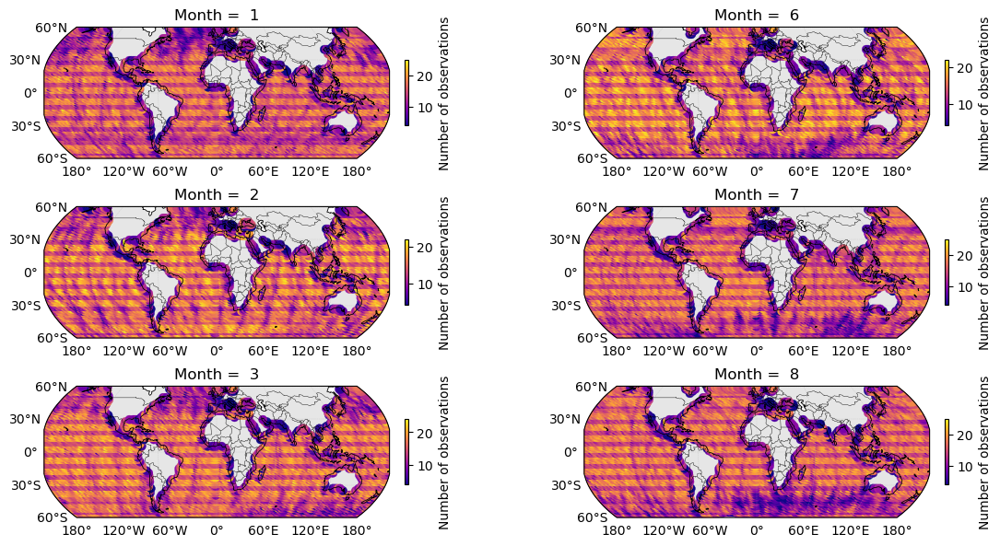

In [8]:
figs, axs = plt.subplots(3, 2,figsize=(12, 6),
    subplot_kw={"projection": ccrs.Robinson()})
for m in ['1','2','3']:
    ds_boxes = ds_boxes_JFM.sel(month=m)
    fig,ax=plot_box(ds_boxes["n_segments"].values,
                       ds_boxes["lon_center"].values,
                       ds_boxes["lat_center"].values,
                       #projection=ccrs.EqualEarth(),
                       cmap="plasma", title=f"Month =  {m}",
            fig=figs,ax=axs[int(m)-1,0])
    ax.set_extent([LON_MIN-180,LON_MAX-180,LAT_MIN,LAT_MAX], crs=ccrs.PlateCarree())

for m in ['6','7','8']:
    ds_boxes = ds_boxes_JJA.sel(month=m)
    fig,ax=plot_box(ds_boxes["n_segments"].values,
                       ds_boxes["lon_center"].values,
                       ds_boxes["lat_center"].values,
                       #projection=ccrs.EqualEarth(),
                       cmap="plasma", title=f"Month =  {m}",
            fig=figs,ax=axs[int(m)-6,1])
    ax.set_extent([LON_MIN-180,LON_MAX-180,LAT_MIN,LAT_MAX], crs=ccrs.PlateCarree())
figs.tight_layout()


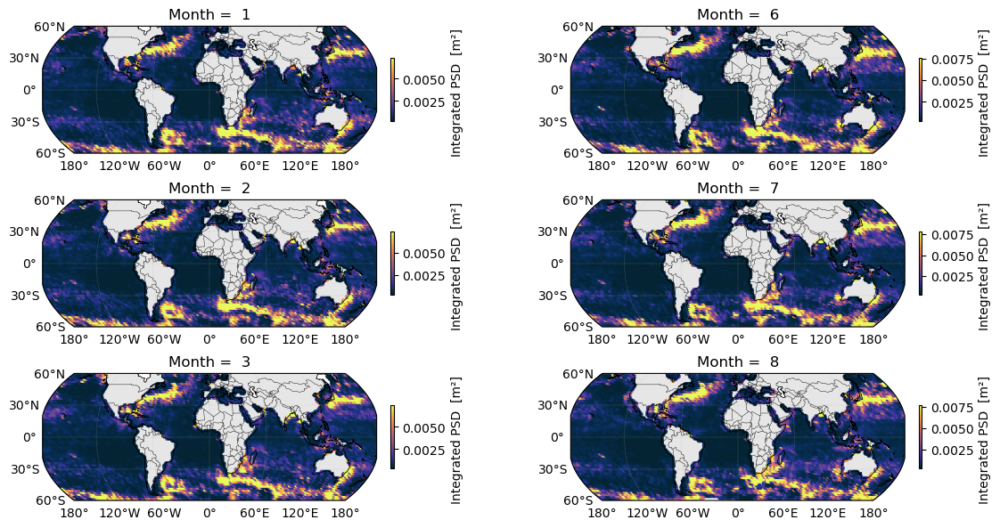

In [10]:
import cmocean
K_MIN, K_MAX = 1/500, 1/6
figs, axs = plt.subplots(3, 2,figsize=(12, 6),
    subplot_kw={"projection": ccrs.Robinson()})
for m in ['1','2','3']:
    ds_boxes = ds_boxes_JFM.sel(month=m)
    k      = ds_boxes['wavenumber'].values
    k_mask = (k >= K_MIN) & (k <= K_MAX)
    dk     = np.gradient(k)
    energy = np.nansum(ds_boxes['mean_psd'].values[:, k_mask] * dk[k_mask], axis=1)
    fig,ax = plot_box(energy,ds_boxes["lon_center"].values,ds_boxes["lat_center"].values,
                       cmap=cmocean.cm.thermal, title=f"Month =  {m}", s=15,
                      label=f'Integrated PSD  [m²] ',vmin=np.nanpercentile(energy, 5),vmax=np.nanpercentile(energy, 95),
                      fig=figs,ax=axs[int(m)-1,0])
    ax.set_extent([LON_MIN-180,LON_MAX-180,LAT_MIN,LAT_MAX], crs=ccrs.PlateCarree())

for m in ['6','7','8']:
    ds_boxes = ds_boxes_JJA.sel(month=m)
    k      = ds_boxes['wavenumber'].values
    k_mask = (k >= K_MIN) & (k <= K_MAX)
    dk     = np.gradient(k)
    energy = np.nansum(ds_boxes['mean_psd'].values[:, k_mask] * dk[k_mask], axis=1)
    fig,ax = plot_box(energy,ds_boxes["lon_center"].values,ds_boxes["lat_center"].values,
                      cmap=cmocean.cm.thermal, title=f"Month =  {m}", s=15,
                      label=f'Integrated PSD  [m²] ',vmin=np.nanpercentile(energy, 5),vmax=np.nanpercentile(energy, 95),
                      fig=figs,ax=axs[int(m)-6,1])
    ax.set_extent([LON_MIN-180,LON_MAX-180,LAT_MIN,LAT_MAX], crs=ccrs.PlateCarree())
figs.tight_layout()


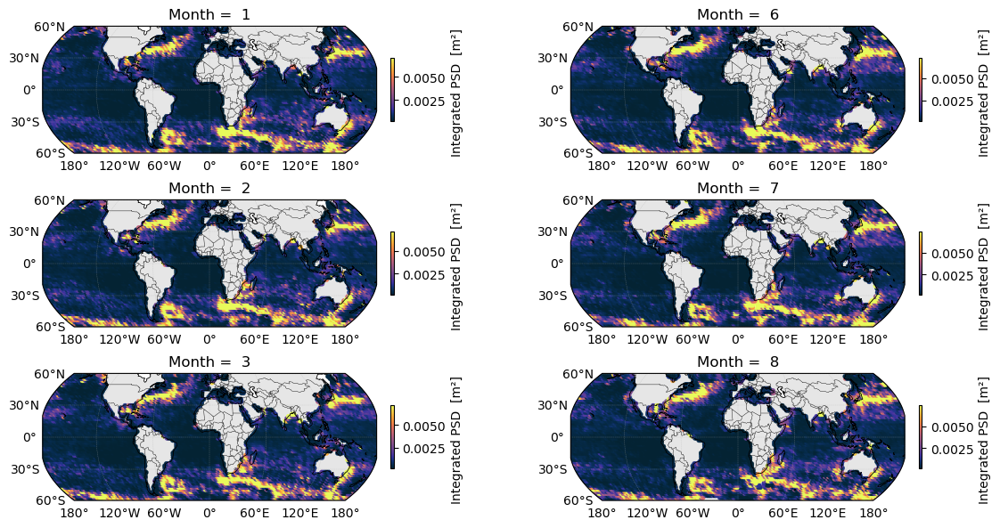

In [11]:
K_MIN, K_MAX = 1/500, 1/125
figs, axs = plt.subplots(3, 2,figsize=(12, 6),
    subplot_kw={"projection": ccrs.Robinson()})
for m in ['1','2','3']:
    ds_boxes = ds_boxes_JFM.sel(month=m)
    k      = ds_boxes['wavenumber'].values
    k_mask = (k >= K_MIN) & (k <= K_MAX)
    dk     = np.gradient(k)
    energy = np.nansum(ds_boxes['mean_psd'].values[:, k_mask] * dk[k_mask], axis=1)
    fig,ax = plot_box(energy,ds_boxes["lon_center"].values,ds_boxes["lat_center"].values,
                       cmap=cmocean.cm.thermal, title=f"Month =  {m}", s=15,
                      label=f'Integrated PSD  [m²] ',vmin=np.nanpercentile(energy, 5),vmax=np.nanpercentile(energy, 95),
                      fig=figs,ax=axs[int(m)-1,0])
    ax.set_extent([LON_MIN-180,LON_MAX-180,LAT_MIN,LAT_MAX], crs=ccrs.PlateCarree())

for m in ['6','7','8']:
    ds_boxes = ds_boxes_JJA.sel(month=m)
    k      = ds_boxes['wavenumber'].values
    k_mask = (k >= K_MIN) & (k <= K_MAX)
    dk     = np.gradient(k)
    energy = np.nansum(ds_boxes['mean_psd'].values[:, k_mask] * dk[k_mask], axis=1)
    fig,ax = plot_box(energy,ds_boxes["lon_center"].values,ds_boxes["lat_center"].values,
                      cmap=cmocean.cm.thermal, title=f"Month =  {m}", s=15,
                      label=f'Integrated PSD  [m²] ',vmin=np.nanpercentile(energy, 5),vmax=np.nanpercentile(energy, 95),
                      fig=figs,ax=axs[int(m)-6,1])
    ax.set_extent([LON_MIN-180,LON_MAX-180,LAT_MIN,LAT_MAX], crs=ccrs.PlateCarree())
figs.tight_layout()


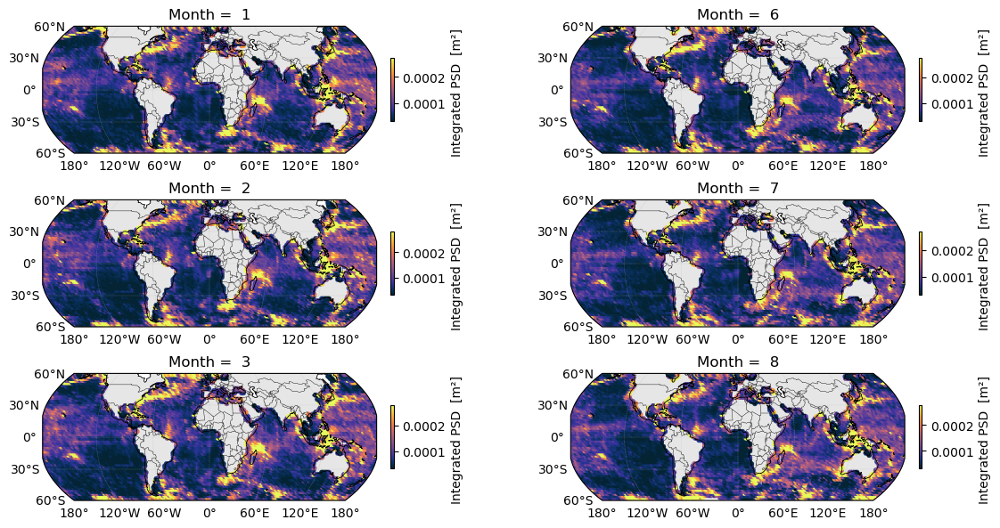

In [12]:
K_MIN, K_MAX = 1/125, 1/50
figs, axs = plt.subplots(3, 2,figsize=(12, 6),
    subplot_kw={"projection": ccrs.Robinson()})
for m in ['1','2','3']:
    ds_boxes = ds_boxes_JFM.sel(month=m)
    k      = ds_boxes['wavenumber'].values
    k_mask = (k >= K_MIN) & (k <= K_MAX)
    dk     = np.gradient(k)
    energy = np.nansum(ds_boxes['mean_psd'].values[:, k_mask] * dk[k_mask], axis=1)
    fig,ax = plot_box(energy,ds_boxes["lon_center"].values,ds_boxes["lat_center"].values,
                       cmap=cmocean.cm.thermal, title=f"Month =  {m}", s=15,
                      label=f'Integrated PSD  [m²] ',vmin=np.nanpercentile(energy, 5),vmax=np.nanpercentile(energy, 95),
                      fig=figs,ax=axs[int(m)-1,0])
    ax.set_extent([LON_MIN-180,LON_MAX-180,LAT_MIN,LAT_MAX], crs=ccrs.PlateCarree())

for m in ['6','7','8']:
    ds_boxes = ds_boxes_JJA.sel(month=m)
    k      = ds_boxes['wavenumber'].values
    k_mask = (k >= K_MIN) & (k <= K_MAX)
    dk     = np.gradient(k)
    energy = np.nansum(ds_boxes['mean_psd'].values[:, k_mask] * dk[k_mask], axis=1)
    fig,ax = plot_box(energy,ds_boxes["lon_center"].values,ds_boxes["lat_center"].values,
                      cmap=cmocean.cm.thermal, title=f"Month =  {m}", s=15,
                      label=f'Integrated PSD  [m²] ',vmin=np.nanpercentile(energy, 5),vmax=np.nanpercentile(energy, 95),
                      fig=figs,ax=axs[int(m)-6,1])
    ax.set_extent([LON_MIN-180,LON_MAX-180,LAT_MIN,LAT_MAX], crs=ccrs.PlateCarree())
figs.tight_layout()


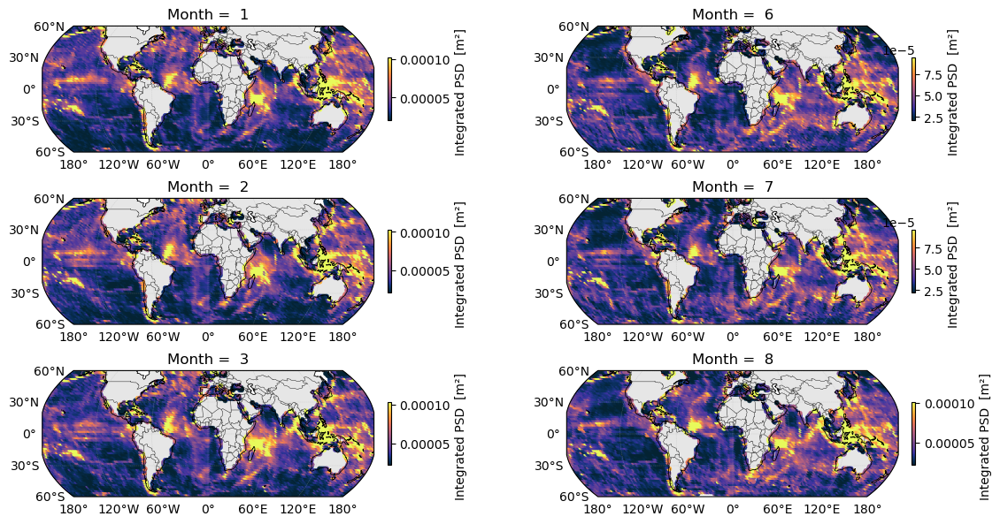

In [13]:
K_MIN, K_MAX = 1/50, 1/10
figs, axs = plt.subplots(3, 2,figsize=(12, 6),
    subplot_kw={"projection": ccrs.Robinson()})
for m in ['1','2','3']:
    ds_boxes = ds_boxes_JFM.sel(month=m)
    k      = ds_boxes['wavenumber'].values
    k_mask = (k >= K_MIN) & (k <= K_MAX)
    dk     = np.gradient(k)
    energy = np.nansum(ds_boxes['mean_psd'].values[:, k_mask] * dk[k_mask], axis=1)
    fig,ax = plot_box(energy,ds_boxes["lon_center"].values,ds_boxes["lat_center"].values,
                       cmap=cmocean.cm.thermal, title=f"Month =  {m}", s=15,
                      label=f'Integrated PSD  [m²] ',vmin=np.nanpercentile(energy, 5),vmax=np.nanpercentile(energy, 95),
                      fig=figs,ax=axs[int(m)-1,0])
    ax.set_extent([LON_MIN-180,LON_MAX-180,LAT_MIN,LAT_MAX], crs=ccrs.PlateCarree())

for m in ['6','7','8']:
    ds_boxes = ds_boxes_JJA.sel(month=m)
    k      = ds_boxes['wavenumber'].values
    k_mask = (k >= K_MIN) & (k <= K_MAX)
    dk     = np.gradient(k)
    energy = np.nansum(ds_boxes['mean_psd'].values[:, k_mask] * dk[k_mask], axis=1)
    fig,ax = plot_box(energy,ds_boxes["lon_center"].values,ds_boxes["lat_center"].values,
                      cmap=cmocean.cm.thermal, title=f"Month =  {m}", s=15,
                      label=f'Integrated PSD  [m²] ',vmin=np.nanpercentile(energy, 5),vmax=np.nanpercentile(energy, 95),
                      fig=figs,ax=axs[int(m)-6,1])
    ax.set_extent([LON_MIN-180,LON_MAX-180,LAT_MIN,LAT_MAX], crs=ccrs.PlateCarree())
figs.tight_layout()


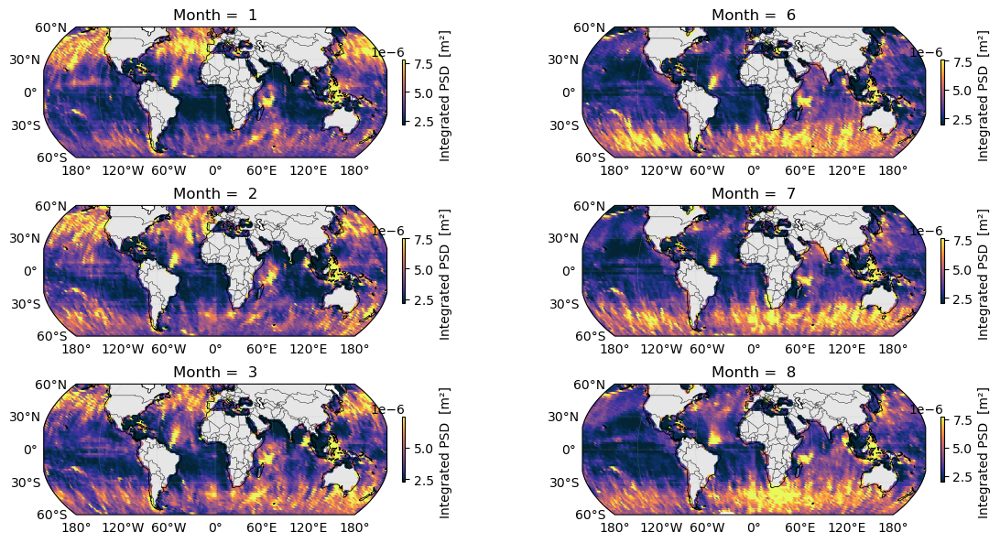

In [14]:
K_MIN, K_MAX = 1/10, 1/6
figs, axs = plt.subplots(3, 2,figsize=(12, 6),
    subplot_kw={"projection": ccrs.Robinson()})
for m in ['1','2','3']:
    ds_boxes = ds_boxes_JFM.sel(month=m)
    k      = ds_boxes['wavenumber'].values
    k_mask = (k >= K_MIN) & (k <= K_MAX)
    dk     = np.gradient(k)
    energy = np.nansum(ds_boxes['mean_psd'].values[:, k_mask] * dk[k_mask], axis=1)
    fig,ax = plot_box(energy,ds_boxes["lon_center"].values,ds_boxes["lat_center"].values,
                       cmap=cmocean.cm.thermal, title=f"Month =  {m}", s=15,
                      label=f'Integrated PSD  [m²] ',vmin=np.nanpercentile(energy, 5),vmax=np.nanpercentile(energy, 95),
                      fig=figs,ax=axs[int(m)-1,0])
    ax.set_extent([LON_MIN-180,LON_MAX-180,LAT_MIN,LAT_MAX], crs=ccrs.PlateCarree())

for m in ['6','7','8']:
    ds_boxes = ds_boxes_JJA.sel(month=m)
    k      = ds_boxes['wavenumber'].values
    k_mask = (k >= K_MIN) & (k <= K_MAX)
    dk     = np.gradient(k)
    energy = np.nansum(ds_boxes['mean_psd'].values[:, k_mask] * dk[k_mask], axis=1)
    fig,ax = plot_box(energy,ds_boxes["lon_center"].values,ds_boxes["lat_center"].values,
                      cmap=cmocean.cm.thermal, title=f"Month =  {m}", s=15,
                      label=f'Integrated PSD  [m²] ',vmin=np.nanpercentile(energy, 5),vmax=np.nanpercentile(energy, 95),
                      fig=figs,ax=axs[int(m)-6,1])
    ax.set_extent([LON_MIN-180,LON_MAX-180,LAT_MIN,LAT_MAX], crs=ccrs.PlateCarree())
figs.tight_layout()


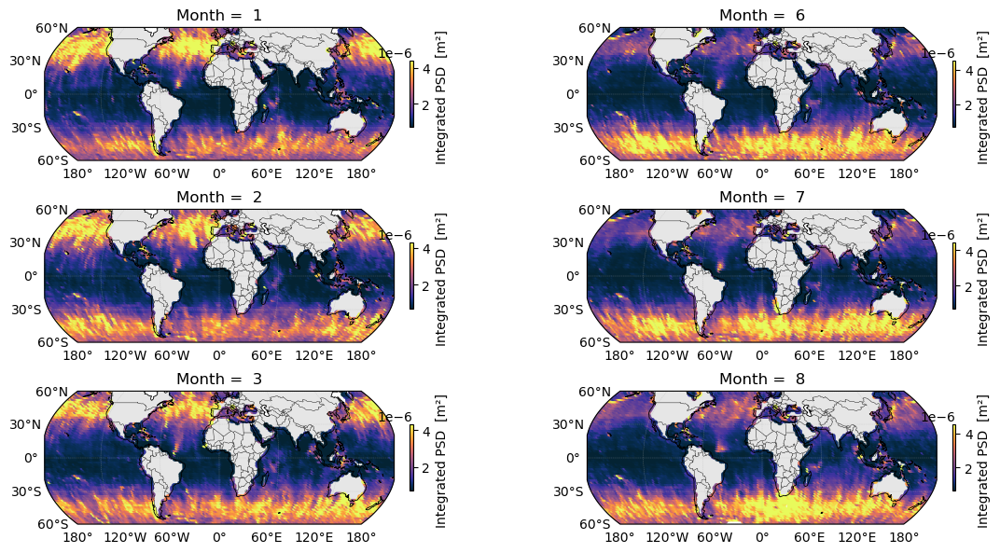

In [15]:
K_MIN, K_MAX = 1/6, 1/4
figs, axs = plt.subplots(3, 2,figsize=(12, 6),
    subplot_kw={"projection": ccrs.Robinson()})
for m in ['1','2','3']:
    ds_boxes = ds_boxes_JFM.sel(month=m)
    k      = ds_boxes['wavenumber'].values
    k_mask = (k >= K_MIN) & (k <= K_MAX)
    dk     = np.gradient(k)
    energy = np.nansum(ds_boxes['mean_psd'].values[:, k_mask] * dk[k_mask], axis=1)
    fig,ax = plot_box(energy,ds_boxes["lon_center"].values,ds_boxes["lat_center"].values,
                       cmap=cmocean.cm.thermal, title=f"Month =  {m}", s=15,
                      label=f'Integrated PSD  [m²] ',vmin=np.nanpercentile(energy, 5),vmax=np.nanpercentile(energy, 95),
                      fig=figs,ax=axs[int(m)-1,0])
    ax.set_extent([LON_MIN-180,LON_MAX-180,LAT_MIN,LAT_MAX], crs=ccrs.PlateCarree())

for m in ['6','7','8']:
    ds_boxes = ds_boxes_JJA.sel(month=m)
    k      = ds_boxes['wavenumber'].values
    k_mask = (k >= K_MIN) & (k <= K_MAX)
    dk     = np.gradient(k)
    energy = np.nansum(ds_boxes['mean_psd'].values[:, k_mask] * dk[k_mask], axis=1)
    fig,ax = plot_box(energy,ds_boxes["lon_center"].values,ds_boxes["lat_center"].values,
                      cmap=cmocean.cm.thermal, title=f"Month =  {m}", s=15,
                      label=f'Integrated PSD  [m²] ',vmin=np.nanpercentile(energy, 5),vmax=np.nanpercentile(energy, 95),
                      fig=figs,ax=axs[int(m)-6,1])
    ax.set_extent([LON_MIN-180,LON_MAX-180,LAT_MIN,LAT_MAX], crs=ccrs.PlateCarree())
figs.tight_layout()


## Averaged spectra

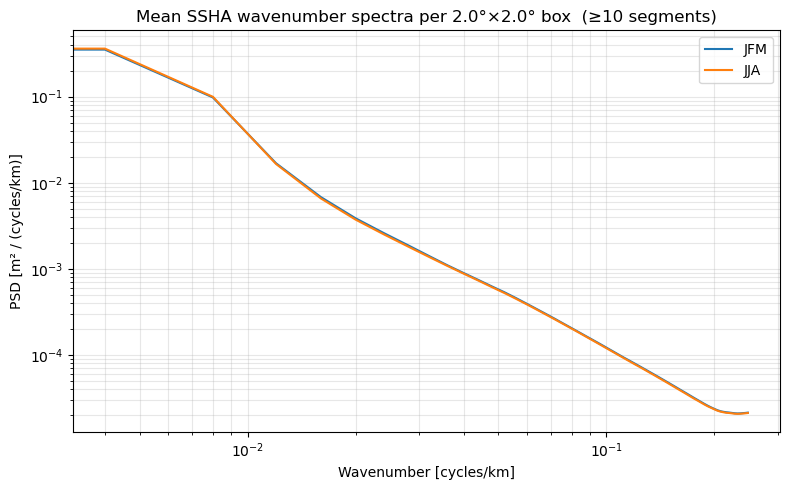

In [16]:
MIN_SEGMENTS_PER_BOX = 10

fig, ax = plt.subplots(figsize=(8, 5))
mean_psd = ds_boxes_JFM.where(ds_boxes_JFM.n_segments>MIN_SEGMENTS_PER_BOX
                                                ).mean_psd.sel(month='total').mean(['box'])
ax.loglog(mean_psd["wavenumber"], mean_psd,label='JFM')
mean_psd = ds_boxes_JJA.where(ds_boxes_JJA.n_segments>MIN_SEGMENTS_PER_BOX
                                                ).mean_psd.sel(month='total').mean(['box'])
ax.loglog(mean_psd["wavenumber"], mean_psd,label='JJA')


if False:
    for line in [1/500,1/125,1/50,1/30,1/10,1/5,1/4]:
        ax.axvline(line,c='grey',ls='--',alpha=0.8)
ax.set_xlabel("Wavenumber [cycles/km]")
ax.set_ylabel("PSD [m² / (cycles/km)]")
ax.set_title(f"Mean SSHA wavenumber spectra per {BOX_DEG}°×{BOX_DEG}° box  "
             f"(≥{MIN_SEGMENTS_PER_BOX} segments)")
#ax.legend()
ax.grid(True, which="both", alpha=0.3)

ax.legend()
fig.tight_layout()

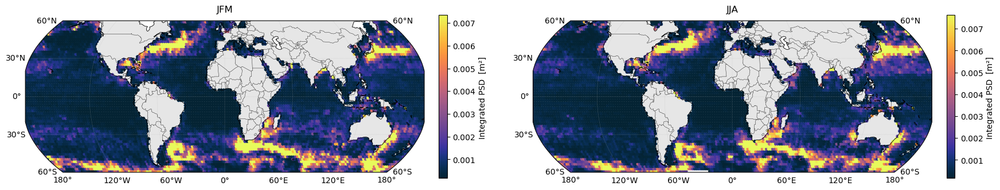

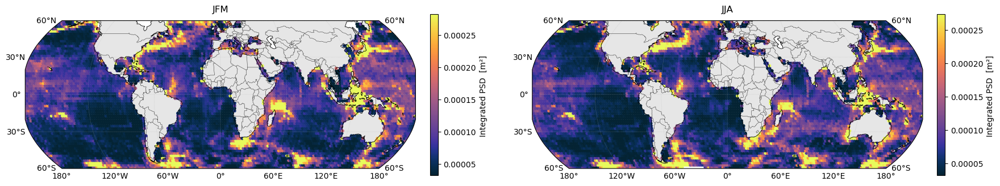

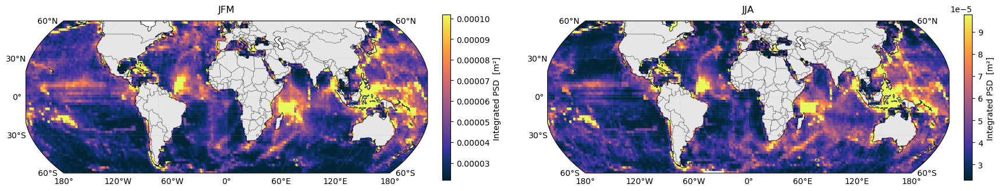

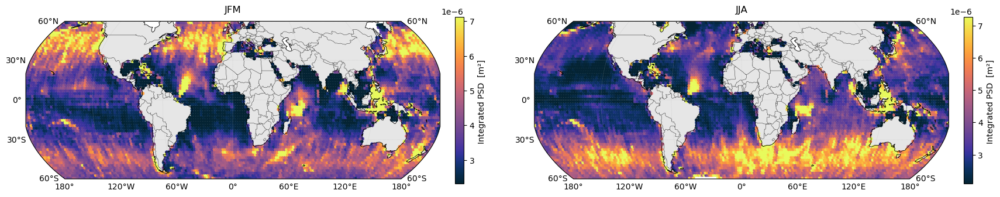

In [17]:
k_min,k_max = [1/SEGMENT_LENGTH_KM/2,1/125,1/50,1/10], [1/125,1/50,1/10,1/6] # /km
MIN_SEGMENTS_PER_BOX = 5
titles = ['JFM','JJA']
for K_MIN,K_MAX in zip(k_min,k_max):
    figs, axs = plt.subplots(1, 2,figsize=(18, 6),
        subplot_kw={"projection": ccrs.Robinson()})
    for i,ds in enumerate([ds_boxes_JFM,ds_boxes_JJA]):    
        ds_boxes = ds.sel(month='total')
        k      = ds_boxes['wavenumber'].values
        k_mask = (k >= K_MIN) & (k <= K_MAX)
        dk     = np.gradient(k)
        energy = np.nansum(ds_boxes['mean_psd'].values[:, k_mask] * dk[k_mask], axis=1)
        fig,ax = plot_box(energy,ds_boxes["lon_center"].values,ds_boxes["lat_center"].values,
                           cmap=cmocean.cm.thermal, title=titles[i], s=15,
                          label=f'Integrated PSD  [m²] ',vmin=np.nanpercentile(energy, 5),vmax=np.nanpercentile(energy, 95),
                          fig=figs,ax=axs[i])
        axs[i].set_extent([LON_MIN-180,LON_MAX-180,LAT_MIN,LAT_MAX], crs=ccrs.PlateCarree())
    figs.tight_layout()


/var/folders/fv/pmf052vs1g77j8b23nzvlkmm0000gr/T/ipykernel_2749/560721739.py:13: RuntimeWarning: divide by zero encountered in log10
  k_vals = np.log10(ds_boxes["wavenumber"].values)          # (n_boxes, nk)
/var/folders/fv/pmf052vs1g77j8b23nzvlkmm0000gr/T/ipykernel_2749/560721739.py:13: RuntimeWarning: divide by zero encountered in log10
  k_vals = np.log10(ds_boxes["wavenumber"].values)          # (n_boxes, nk)
/var/folders/fv/pmf052vs1g77j8b23nzvlkmm0000gr/T/ipykernel_2749/560721739.py:13: RuntimeWarning: divide by zero encountered in log10
  k_vals = np.log10(ds_boxes["wavenumber"].values)          # (n_boxes, nk)
/var/folders/fv/pmf052vs1g77j8b23nzvlkmm0000gr/T/ipykernel_2749/560721739.py:13: RuntimeWarning: divide by zero encountered in log10
  k_vals = np.log10(ds_boxes["wavenumber"].values)          # (n_boxes, nk)
/var/folders/fv/pmf052vs1g77j8b23nzvlkmm0000gr/T/ipykernel_2749/560721739.py:13: RuntimeWarning: divide by zero encountered in log10
  k_vals = np.log10(ds_boxes["w

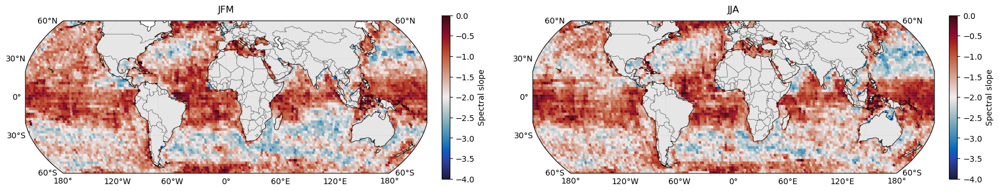

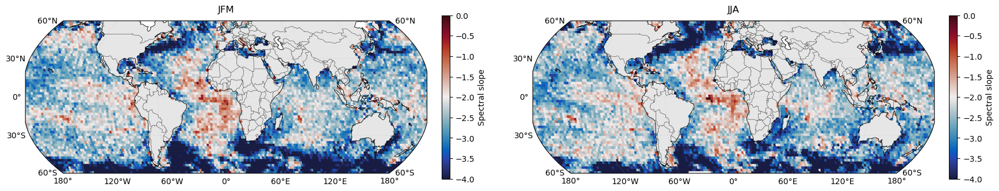

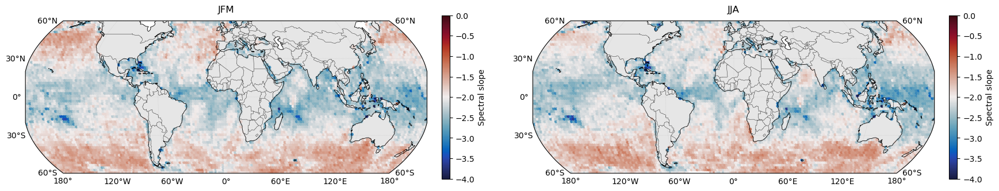

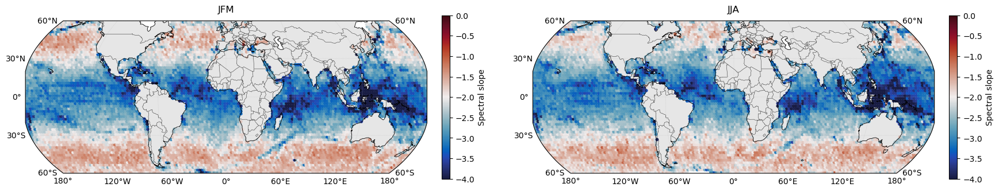

In [18]:
k_min,k_max = [1/SEGMENT_LENGTH_KM/2,1/125,1/50,1/10], [1/125,1/50,1/10,1/6] # /km
MIN_SEGMENTS_PER_BOX = 5
titles = ['JFM','JJA']
for K_MIN,K_MAX in zip(k_min,k_max):
    figs, axs = plt.subplots(1, 2,figsize=(18, 6),
        subplot_kw={"projection": ccrs.Robinson()})
    for i,ds in enumerate([ds_boxes_JFM,ds_boxes_JJA]):    
        ds_boxes = ds.sel(month='total')
        k      = ds_boxes['wavenumber'].values
        k_mask = (k >= K_MIN) & (k <= K_MAX)
        dk     = np.gradient(k)
        psd_vals = np.log10(ds_boxes["mean_psd"].values)          # (n_boxes, nk)
        k_vals = np.log10(ds_boxes["wavenumber"].values)          # (n_boxes, nk)
        slope_mean = np.nanmean(np.diff(psd_vals[:,k_mask],axis=1)/np.diff(k_vals[k_mask]),axis=1)
        fig,ax = plot_box(slope_mean,ds_boxes["lon_center"].values,ds_boxes["lat_center"].values,
                           cmap=cmocean.cm.balance, title=titles[i], s=15,
                          label=f'Spectral slope',vmin=-4,vmax=0,
                          fig=figs,ax=axs[i])
        axs[i].set_extent([LON_MIN-180,LON_MAX-180,LAT_MIN,LAT_MAX], crs=ccrs.PlateCarree())
    figs.tight_layout()




7899 boxes with ≥ 5 segments
7935 boxes with ≥ 5 segments


/var/folders/fv/pmf052vs1g77j8b23nzvlkmm0000gr/T/ipykernel_22983/873445945.py:39: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()
/var/folders/fv/pmf052vs1g77j8b23nzvlkmm0000gr/T/ipykernel_22983/873445945.py:39: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


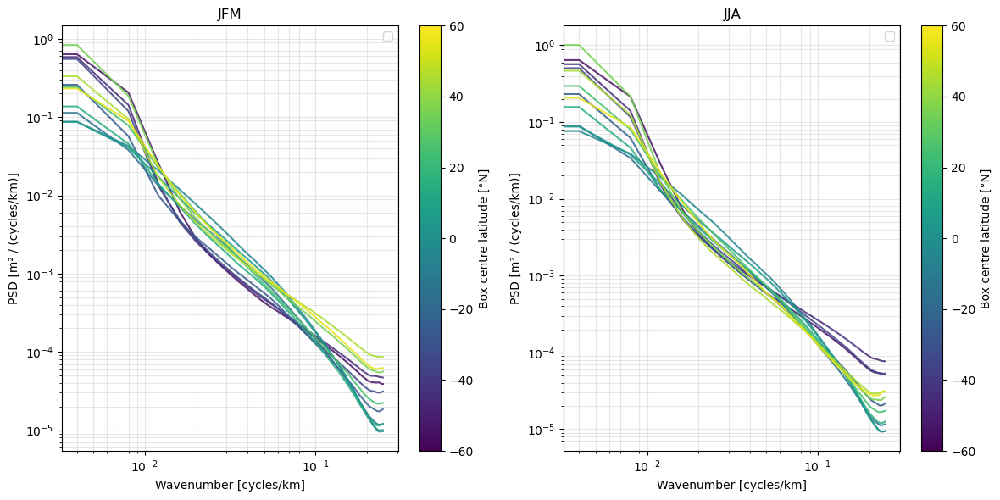

In [31]:
MIN_SEGMENTS_PER_BOX = 5
LAT_BIN_EDGES = np.arange(-60, 61, 10)  # adjust to the pass's latitude range

fig, axs = plt.subplots(1,2,figsize=(12,6))
for i,ds in enumerate([ds_boxes_JFM,ds_boxes_JJA]):
    ds_boxes = ds.sel(month='total')
    good_boxes = ds_boxes.where(ds_boxes["n_segments"] >= MIN_SEGMENTS_PER_BOX, drop=True)
    #good_boxes = good_boxes.where((good_boxes["lat_center"] >= LAT_MIN)&(good_boxes["lat_center"] <= 47), drop=True)
    print(f"{good_boxes.sizes['box']} boxes with ≥ {MIN_SEGMENTS_PER_BOX} segments")
    
    binned = good_boxes.groupby_bins("lat_center", LAT_BIN_EDGES).mean()
    lat_vals = binned["lat_center_bins"].values
    norm = plt.Normalize(vmin=np.min(LAT_BIN_EDGES), vmax=np.max(LAT_BIN_EDGES))
    cmap = plt.get_cmap("viridis")
    
    box=binned
    ax=axs[i]
    #fig, ax = plt.subplots(figsize=(8, 5))
    for j in range(box.sizes["lat_center_bins"]):
        lat_box = box.isel(lat_center_bins = j)
        ax.loglog(lat_box["wavenumber"], lat_box["mean_psd"],color=cmap(norm(float(lat_box["lat_center"]))),lw=1.5, alpha=0.85)
    
    # Reference slopes
    if False:
        k_ref = good_boxes["wavenumber"].values[2:]
        psd0  = float(good_boxes["mean_psd"].isel(box=0).values[2])
        k0    = k_ref[0]
        for exp, ls in ((-2, "--"), (-11/3, ":"),(-5,"+-")):
            lbl = f"$k^{{{exp:.2g}}}$".replace("-3.7", "-11/3")
            ax.loglog(k_ref, psd0 * (k_ref / k0) ** exp, ls, color="gray", label=lbl)
    
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    plt.colorbar(sm, ax=ax, label="Box centre latitude [°N]")
    
    ax.set_xlabel("Wavenumber [cycles/km]")
    ax.set_ylabel("PSD [m² / (cycles/km)]")
    ax.set_title(titles[i])
    ax.legend()
    ax.grid(True, which="both", alpha=0.3)
fig.tight_layout()
